In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
os.chdir('/data/lola/shockle/data_for_paper_attempt2/no_pymc')

In [3]:
traces = {}
for trace in ['a', 'b', 'c', 'd']:
    traces[trace] = [np.load('earm_dreamzs_3chain_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 3):
        traces[trace].append(np.load('earm_dreamzs_3chain_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [4]:
logps = {}
for trace in ['a', 'b', 'c', 'd']:
    logps[trace] = [np.load('earm_dreamzs_3chain_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 3):
        logps[trace].append(np.load('earm_dreamzs_3chain_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[-789209.77715898]
 [-789209.77715898]
 [-789198.26676806]
 ..., 
 [  -4940.75537305]
 [  -4940.75537305]
 [  -4940.75537305]]
Logp of trace:  a  chain:  1  =  [-4966.02209588]
Logp of trace:  a  chain:  2  =  [-4915.68730496]
Logp of trace:  b  chain: 0 =  [[-1379796.68049211]
 [-1365640.94417507]
 [-1154668.23790342]
 ..., 
 [   -4892.06274052]
 [   -4892.06274052]
 [   -4892.06274052]]
Logp of trace:  b  chain:  1  =  [-4899.84012237]
Logp of trace:  b  chain:  2  =  [-4876.89232325]
Logp of trace:  c  chain: 0 =  [[-837445.43524457]
 [-782424.47530932]
 [-781706.15124338]
 ..., 
 [  -4960.45717678]
 [  -4960.45717678]
 [  -4960.45717678]]
Logp of trace:  c  chain:  1  =  [-4957.8818056]
Logp of trace:  c  chain:  2  =  [-5088.10501355]
Logp of trace:  d  chain: 0 =  [[-823106.95268889]
 [-823106.95268889]
 [-821975.44862337]
 ..., 
 [  -4982.19976954]
 [  -4982.19976954]
 [  -4982.19976954]]
Logp of trace:  d  chain:  1  =  [-4936.11223554]
Logp of t

In [5]:
from earm_exp_parameters import earm_rates
uni_idx = []
norm_idx = []
uni_n = 0
norm_n = 0
for i, param in enumerate(model.parameters_rules()):
    if earm_rates[param.name]['type'] == 'uniform':
        uni_idx.append(i)
        uni_n += 1
    elif earm_rates[param.name]['type'] == 'normal':
        norm_idx.append(i)
        norm_n += 1

kf mito:  -14.8452186131  -  0.154781386928
kr mito:  -4.15478138693  -  13.8452186131
kf cyto:  -16.0001205731  -  -1.00012057306
kr cyto:  -2.99987942694  -  15.0001205731


In [6]:
traces['b'][0][:,72]

array([-7.86789421, -7.61830734, -7.52438169, ..., -8.74827605,
       -8.74827605, -8.74827605])

In [7]:
traces['a'][0][:,72]

array([-6.71113433, -6.71113433, -6.37553281, ..., -8.97475742,
       -8.97475742, -8.97475742])

In [8]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a', 'b', 'c', 'd']:
    uni_param_n = 0
    norm_param_n = uni_n
    for i, param in enumerate(model.parameters_rules()):
        if i in uni_idx:
            param_trace_dict_a[param.name] = [traces[run][chain][:,uni_param_n] for chain in range(len(traces[run]))]
            uni_param_n += 1
        else:
            param_trace_dict_a[param.name] = [traces[run][chain][:,norm_param_n] for chain in range(len(traces[run]))]
            norm_param_n += 1
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [9]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  93  of  105  parameters.
Percent of parameters with GR below 1.2:  88.5714285714
Number of parameters with GR below 1.1:  83  of  105  parameters.
Percent of parameters with GR below 1.1:  79.0476190476


[93, 88.57142857142857, 83, 79.04761904761905]

In [10]:
print_convergence_summary(param_trace_dicts['b'])

Number of parameters with GR below 1.2:  99  of  105  parameters.
Percent of parameters with GR below 1.2:  94.2857142857
Number of parameters with GR below 1.1:  85  of  105  parameters.
Percent of parameters with GR below 1.1:  80.9523809524


[99, 94.28571428571428, 85, 80.95238095238095]

In [11]:
print_convergence_summary(param_trace_dicts['c'])

Number of parameters with GR below 1.2:  92  of  105  parameters.
Percent of parameters with GR below 1.2:  87.619047619
Number of parameters with GR below 1.1:  85  of  105  parameters.
Percent of parameters with GR below 1.1:  80.9523809524


[92, 87.61904761904762, 85, 80.95238095238095]

In [12]:
print_convergence_summary(param_trace_dicts['d'])

Number of parameters with GR below 1.2:  84  of  105  parameters.
Percent of parameters with GR below 1.2:  80.0
Number of parameters with GR below 1.1:  60  of  105  parameters.
Percent of parameters with GR below 1.1:  57.1428571429


[84, 80.0, 60, 57.14285714285714]

In [13]:
param_trace_dicts['d']['bind_L_R_to_LR_kf']

[array([-7.17783245, -7.17783245, -6.96235292, ..., -8.09467825,
        -8.09467825, -8.09467825]),
 array([-8.44821299, -8.58376697, -8.58376697, ..., -6.96914027,
        -6.96914027, -6.96914027]),
 array([-8.44821299, -8.44821299, -8.04619163, ..., -7.36631324,
        -7.36631324, -7.36631324])]

60000
3
60000


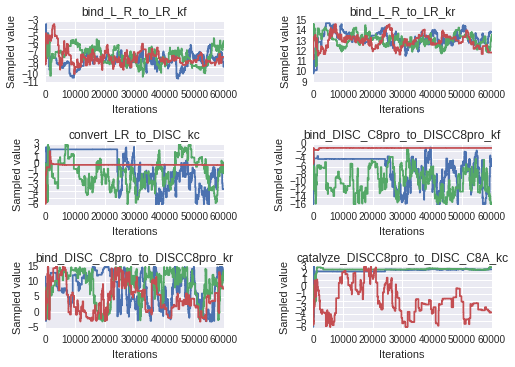

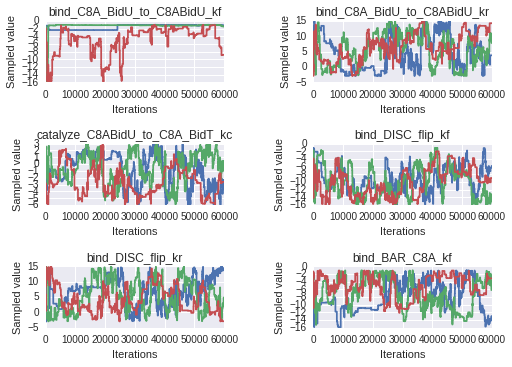

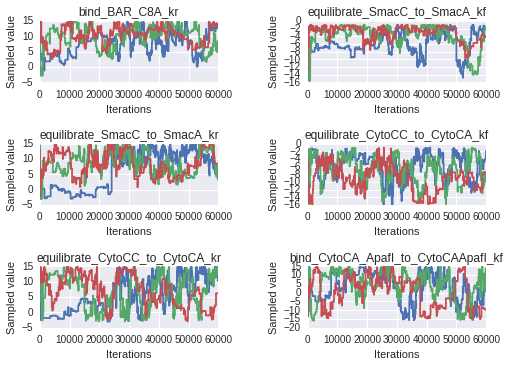

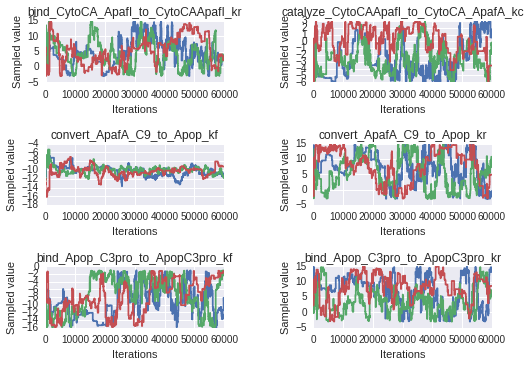

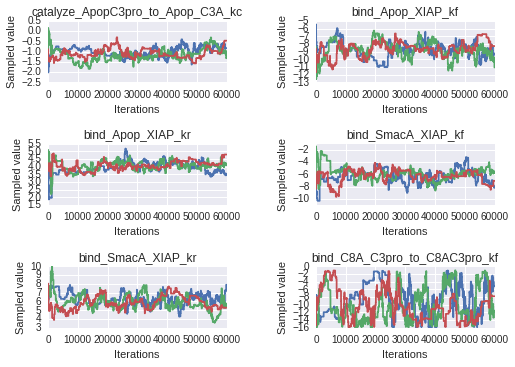

...

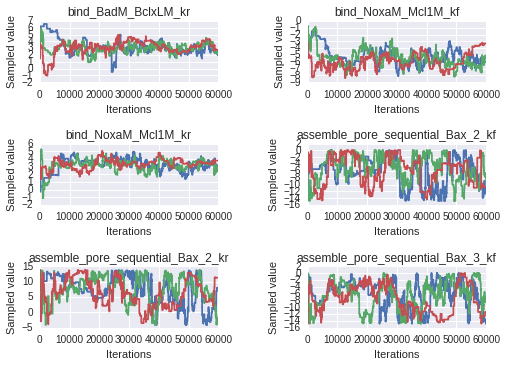

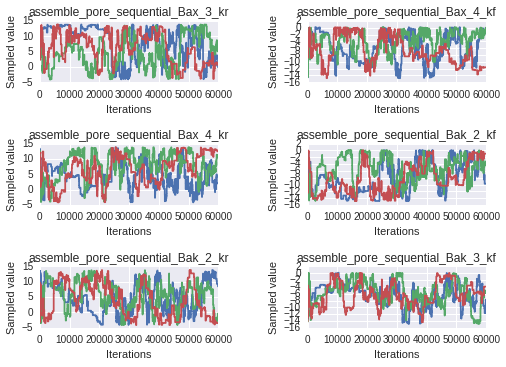

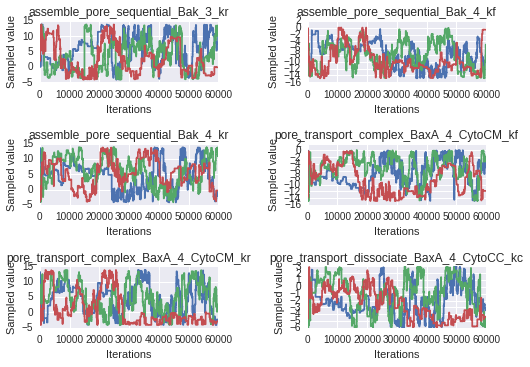

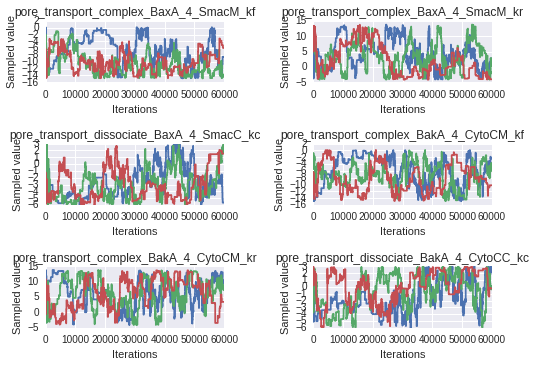

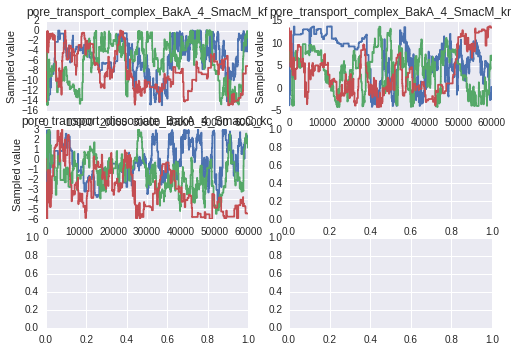

In [14]:
sample_plots(param_trace_dicts['a'])

In [15]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=30000)
trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=30000)
trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=30000)
trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=30000)

/gpfs22/local/centos6/python2/2.7.8/x86_64/gcc46/nonet/lib/python2.7/site-packages/matplotlib-1.5.dev1-py2.7-linux-x86_64.egg/matplotlib/pyplot.py:423: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


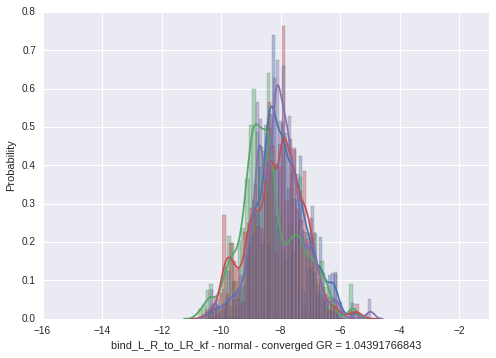

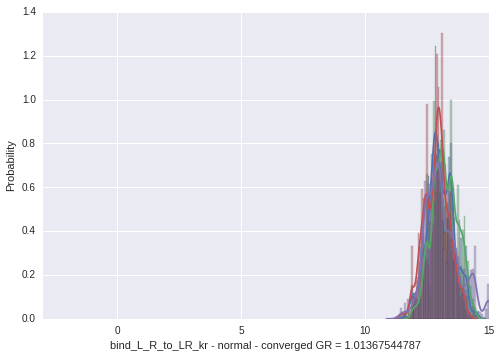

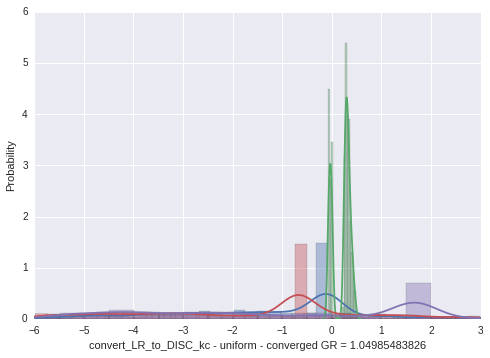

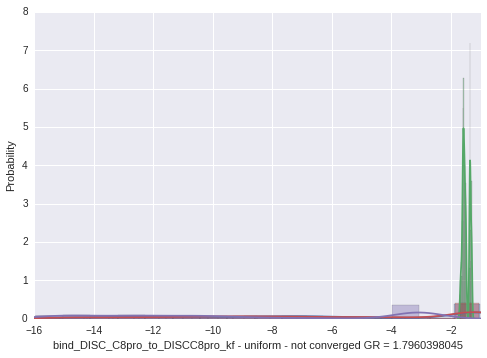

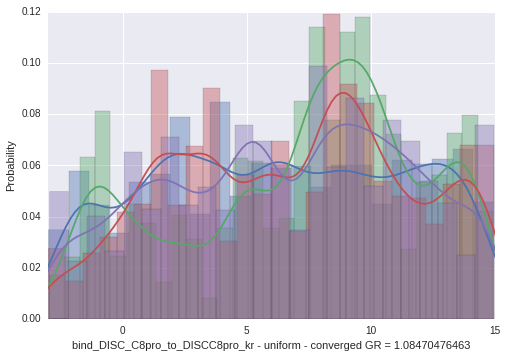

...

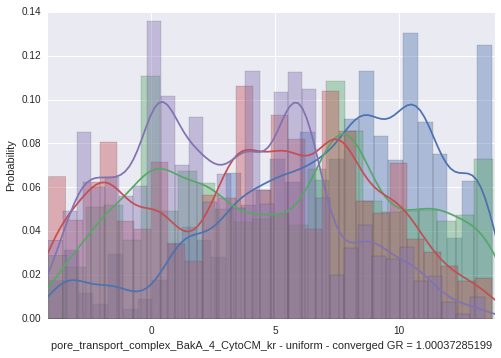

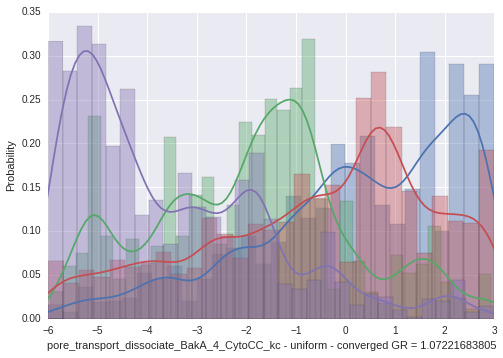

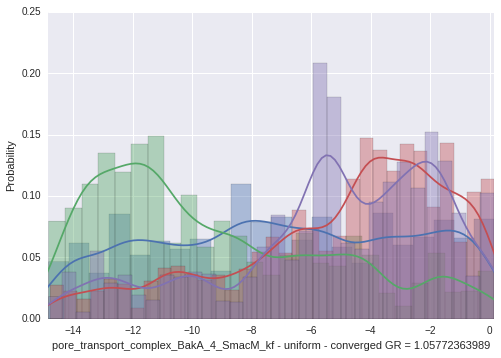

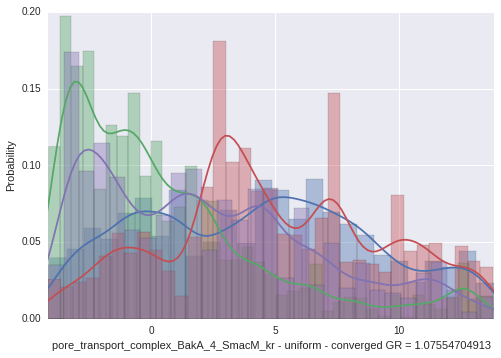

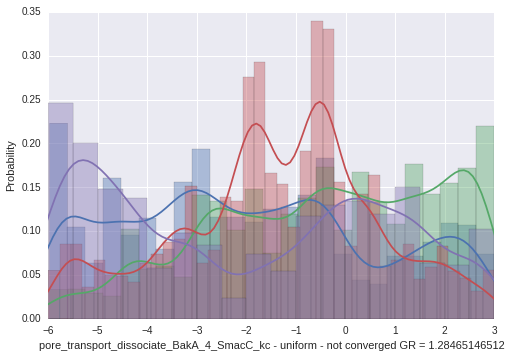

In [16]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True)
    sns.distplot(trace_arr_b[:,dim], hist=True)
    sns.distplot(trace_arr_c[:,dim], hist=True)
    sns.distplot(trace_arr_d[:,dim], hist=True)
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - '+earm_rates[param_name]['type']+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - '+earm_rates[param_name]['type']+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    if earm_rates[param_name]['type'] == 'uniform':
        ax.set_xlim([earm_rates[param_name]['lower'], earm_rates[param_name]['upper']])
    elif 'kf' in param_name:
        ax.set_xlim([-16, -1])
    elif 'kr' in param_name:
        ax.set_xlim([-3, 15])
    elif 'kc' in param_name:
        ax.set_xlim([-6, 3])

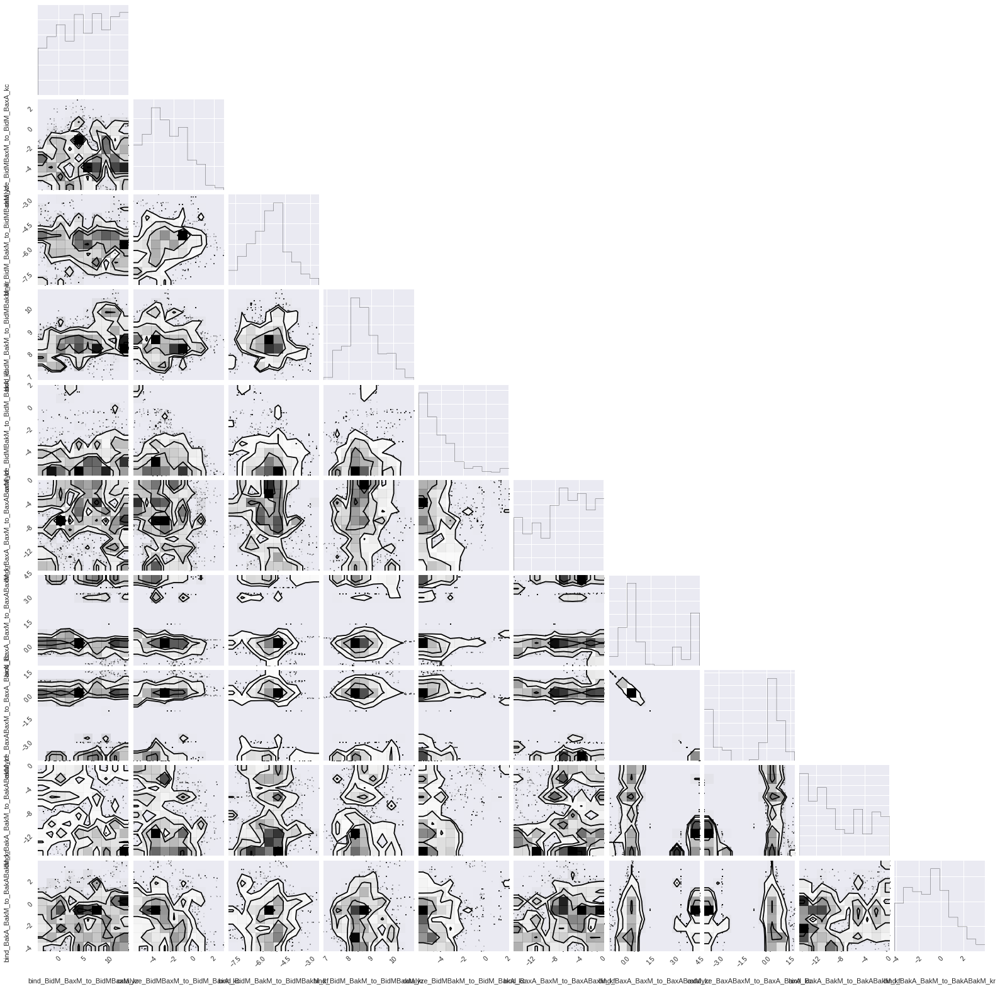

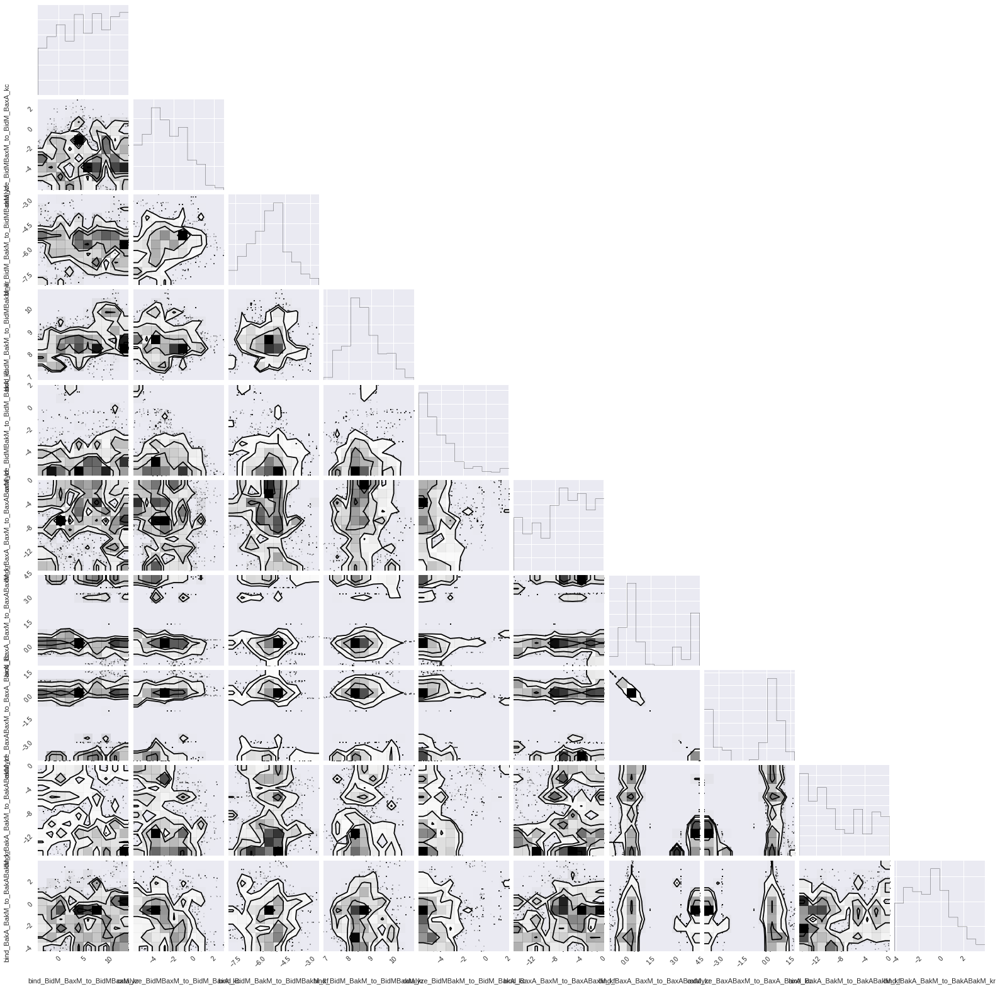

In [17]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)